# <span style="color: #2e6c80;"> Hackathon Topic :– Ecommerce Product Categorization</span>

**Problem Statement:** In the rapidly evolving world of eCommerce, accurate product categorization is crucial for ensuring seamless customer experiences, reducing search friction, and increasing product discoverability. However, the sheer volume of diverse products poses a significant challenge. Current classification systems struggle to handle ambiguities, unconventional naming conventions, and multi-language data. This hackathon aims to address these challenges by inviting participants to create innovative solutions that enhance product categorization efficiency, accuracy, and scalability.
Develop a text classification model that categorizes products with maximum accuracy based on description of the product.


1. **uniq_id:**
   - Description: A unique identifier for each product.
   - Purpose: Acts as the primary key to distinguish each product record uniquely.

2. **crawl_timestamp:**
   - Description: The timestamp when the product data was last scraped or collected.
   - Purpose: Helps identify the data's recency and track changes over time.

3. **product_url:**
   - Description: The URL linking directly to the product's page on the eCommerce platform.
   - Purpose: Allows direct access to the product's information and purchasing page.

4. **product_name:**
   - Description: The name or title of the product as displayed on the eCommerce platform.
   - Purpose: Provides a searchable and readable identification of the product.
   
5. **product_category_tree:**
   - Description: The hierarchical structure representing the product's category on the platform.
   - Purpose: Useful for categorization, analysis, and filtering of products.

6. **pid:**
   - Description: A unique identifier specific to the eCommerce platform for each product.
   - Purpose: Used to reference products internally on the platform.

7. **retail_price:**
   - Description: The original or retail price of the product before any discounts.
   - Purpose: Helps understand the product's standard market value.

8. **discounted_price:**
   - Description: The price of the product after applying any discounts or offers.
   - Purpose: Reflects the final price a customer would pay.

9. **image:**
   - Description: URL linking to the main image of the product.
   - Purpose: Provides visual representation for the product.
   
10. **is_FK_Advantage_product:**
    - Description: A boolean indicator (True/False) showing if the product is part of Advantage program.
    - Purpose: Denotes if the product has additional benefits like faster delivery or special quality checks.

11. **description:**
    - Description: Detailed information about the product, including features, specifications, and usage.
    - Purpose: Helps customers understand the product's value proposition and unique selling points.

12. **product_rating:**
    - Description: The product's overall rating on the platform, based on customer reviews.
    - Purpose: Indicates customer satisfaction and product quality.

13. **overall_rating:**
    - Description: The aggregate rating of the product across different platforms or periods.
    - Purpose: Offers a comprehensive view of the product's reception.

14. **brand:**
    - Description: The name of the brand or manufacturer of the product.
    - Purpose: Assists in brand-based analysis and filtering.

15. **product_specifications:**
    - Description: Detailed specifications of the product, often in JSON or structured format.


In [297]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score,confusion_matrix,classification_report
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from tensorflow.keras.preprocessing.text import Tokenizer
#from tensorflow.keras.preprocessing.sequence import pad_sequences
#from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import re

In [298]:
# Load the dataset
df = pd.read_csv('train_product_data.csv')

In [299]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  14999 non-null  object 
 1   crawl_timestamp          14999 non-null  object 
 2   product_url              14999 non-null  object 
 3   product_name             14999 non-null  object 
 4   product_category_tree    14999 non-null  object 
 5   pid                      14999 non-null  object 
 6   retail_price             14942 non-null  float64
 7   discounted_price         14942 non-null  float64
 8   image                    14996 non-null  object 
 9   is_FK_Advantage_product  14999 non-null  bool   
 10  description              14998 non-null  object 
 11  product_rating           14999 non-null  object 
 12  overall_rating           14999 non-null  object 
 13  brand                    10289 non-null  object 
 14  product_specifications

In [300]:
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."


In [301]:
df.describe()

,retail_price,discounted_price
count,14942.000000,14942.000000
mean,3128.424040,2087.732298
std,9154.463342,7712.247869
min,35.000000,35.000000
25%,699.000000,349.000000
50%,1000.000000,499.000000
75%,1989.750000,999.000000
max,571230.000000,571230.000000


In [302]:
# Check for missing values
df.isna().sum()

uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                 57
discounted_price             57
image                         3
is_FK_Advantage_product       0
description                   1
product_rating                0
overall_rating                0
brand                      4710
product_specifications        6
dtype: int64

In [303]:
df['description'].shape

(14999,)

In [304]:
labels=df['product_category_tree'].unique()

In [305]:
df['description'][0]

"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts"

## EDA and Data Preprocessing


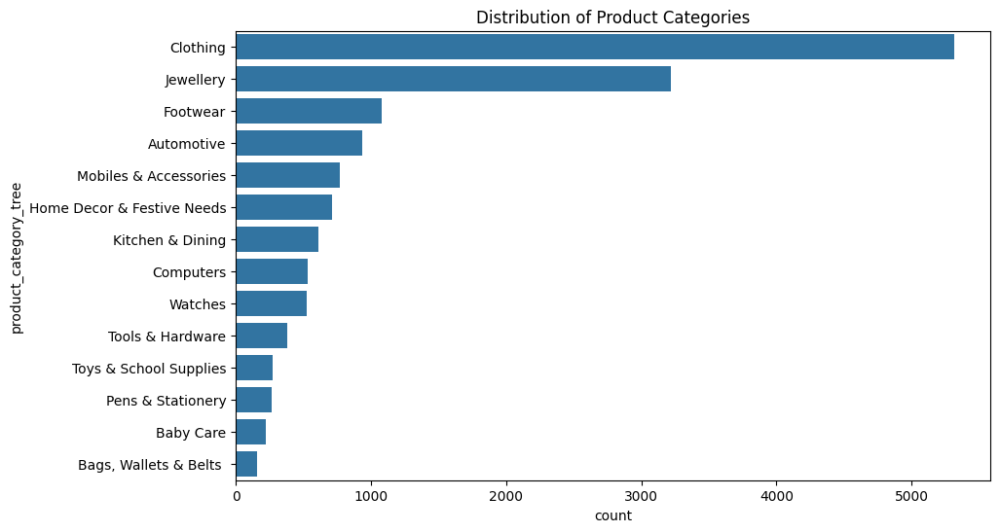

In [306]:
# Plot distribution of product categories
plt.figure(figsize=(10, 6))
sns.countplot(y=df['product_category_tree'], order=df['product_category_tree'].value_counts().index)
plt.title('Distribution of Product Categories')
plt.show()

In [307]:
# Drop missing values
df.dropna(subset='description',inplace=True)

In [308]:
df['description'].shape

(14998,)

In [309]:
df.drop(['uniq_id','crawl_timestamp','product_url','image'],axis=1,inplace=True)

In [310]:
nltk.download('stopwords')
nltk.download('punkt')
stop_words=stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [311]:
# Clean text data using regex

def clean_text(text):
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'\s+', ' ', text)  # Remove extra spaces
    text = re.sub(r'\W', ' ', text)  # Remove non-word characters
    text = text.lower().strip()  # Convert to lower case and strip whitespaces
    return text

In [312]:
df['description'] = df['description'].apply(clean_text)

In [313]:
df['description'] = df.apply(lambda row: nltk.word_tokenize(row['description']), axis=1)

In [314]:
# Generate a word cloud for product descriptions
def show_wordcloud(df, title):
    from wordcloud import WordCloud
    text = ' '.join(df['description'].astype(str).tolist())
    wordcloud = WordCloud(stopwords=stop_words,width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(9, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=30)
    plt.show()

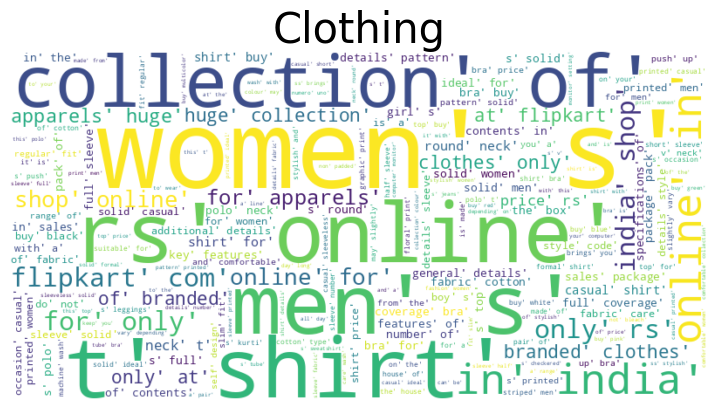

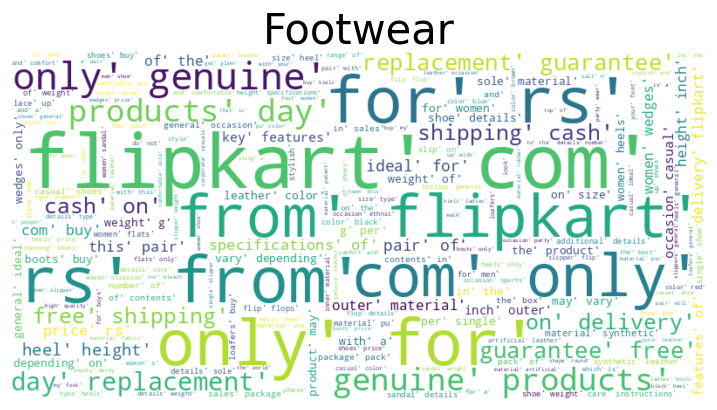

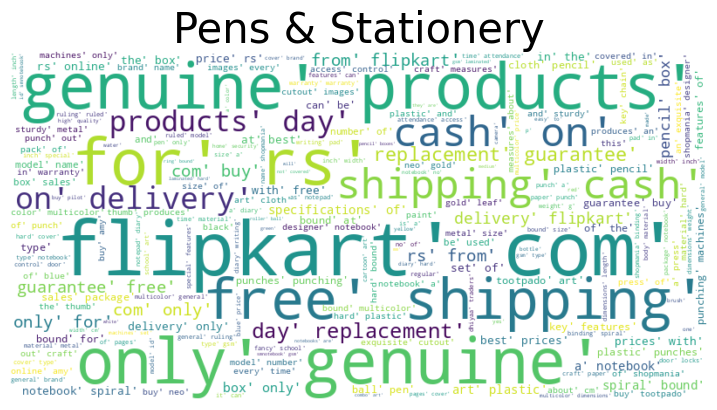

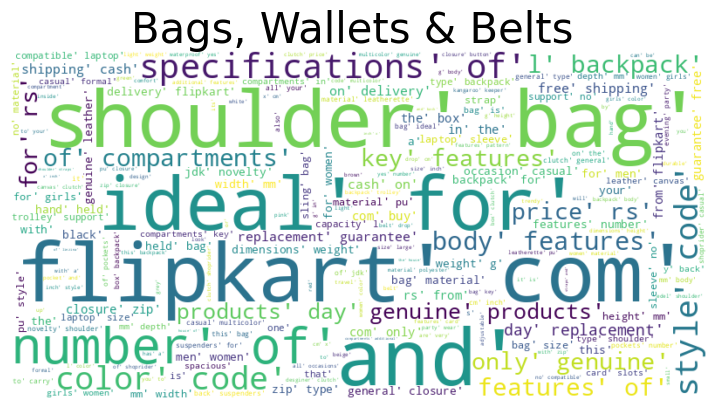

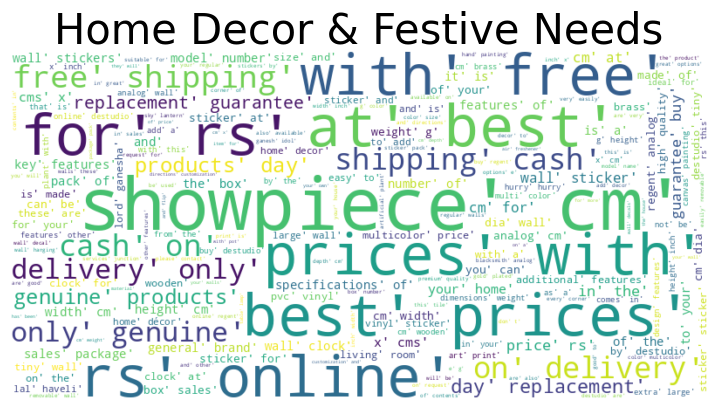

...

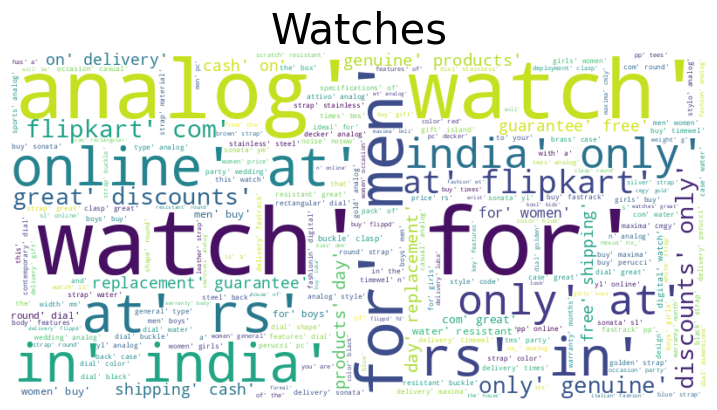

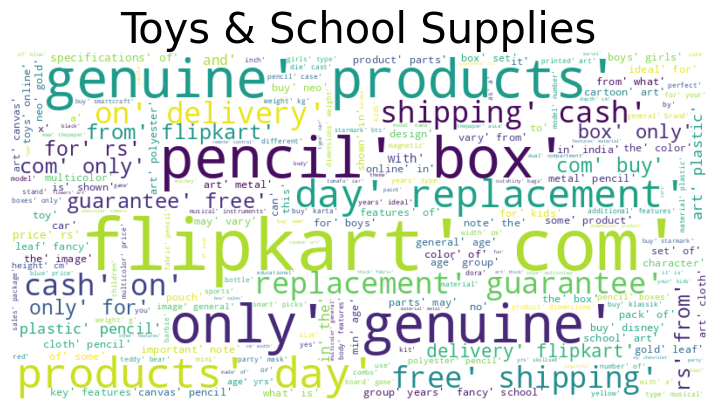

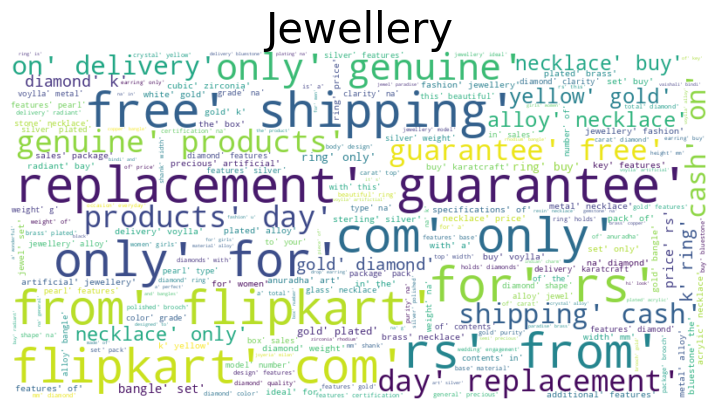

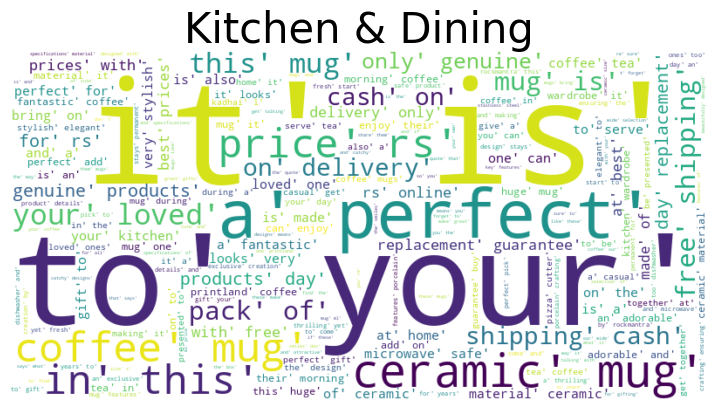

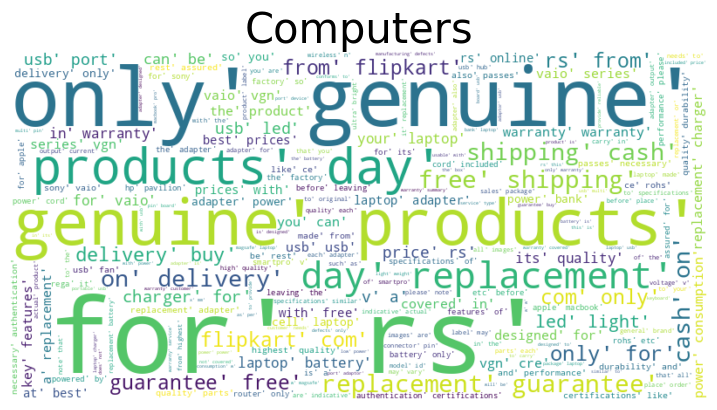

In [315]:
# This for loop goes through the labels and for each category will print the worldcloud.
for category in labels:
    show_wordcloud(df[df['product_category_tree']==category], category)

In [316]:
def remove_stopwords(words):
    #Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stop_words:
            new_words.append(word)
    return new_words


In [317]:
df['description'] = df.apply(lambda row: remove_stopwords(row['description']),axis=1)

In [318]:
def remove_freq_irrelevant_words(words):
    irrelevant_words_corpus = ['flipkart', 'com', 'price', 'genuine', 'only', 'delivery',
                               'free', 'shipping', 'replacement', 'guarantee', 'cash', 'day', '30',
                              'online','huge','collection','india','shop','branded','products','apparel',
                              'sales','package','apparels','neck','key','features','best','prices','alloy',
                              'clothes','buy','yellow','number','contents','general','details',
                              'auto','rs','k']
    new_words = [word for word in words if word not in irrelevant_words_corpus]
    return new_words

In [319]:
# Apply the function to the description column
df['description'] = df['description'].apply(remove_freq_irrelevant_words)

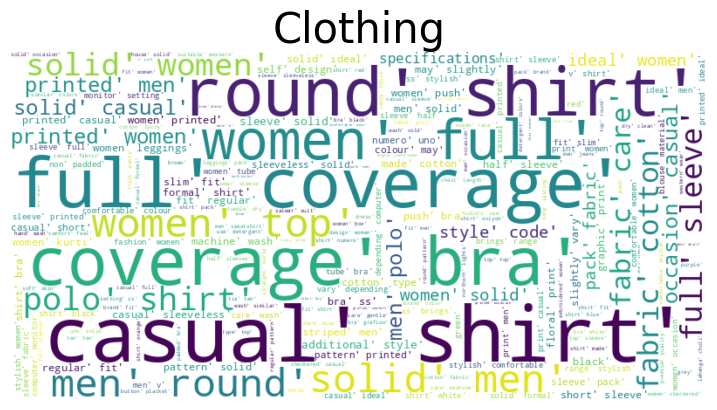

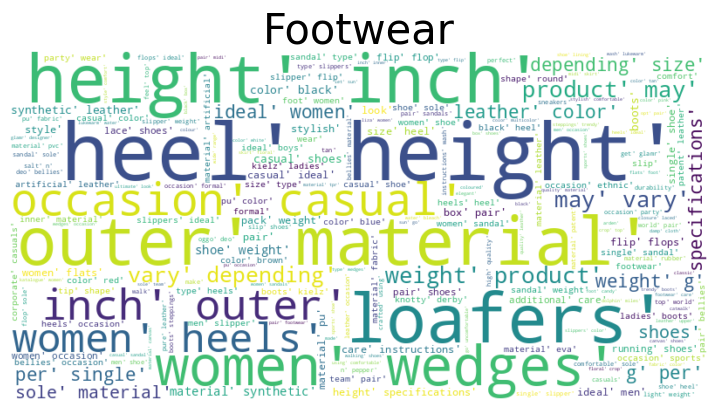

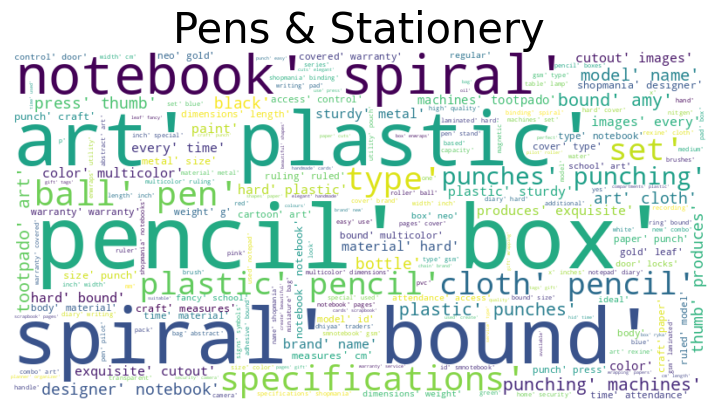

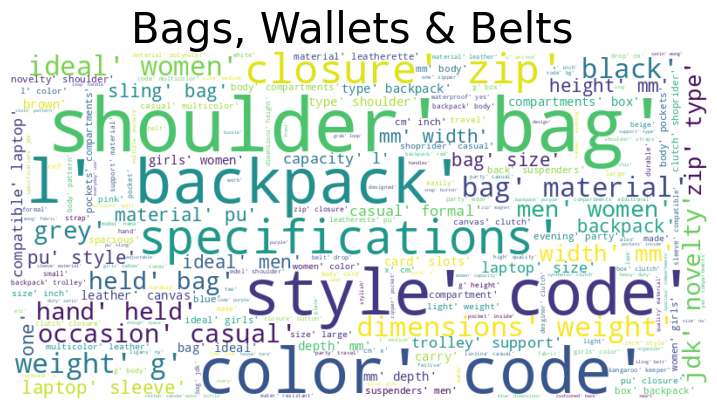

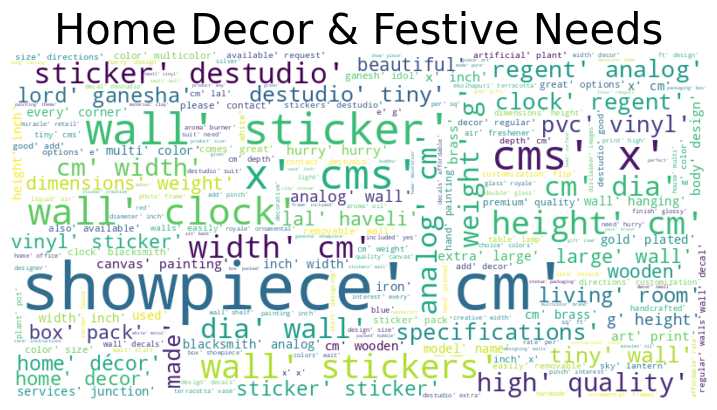

...

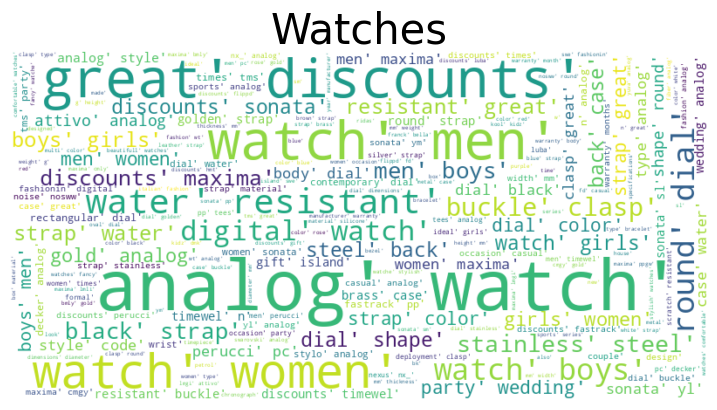

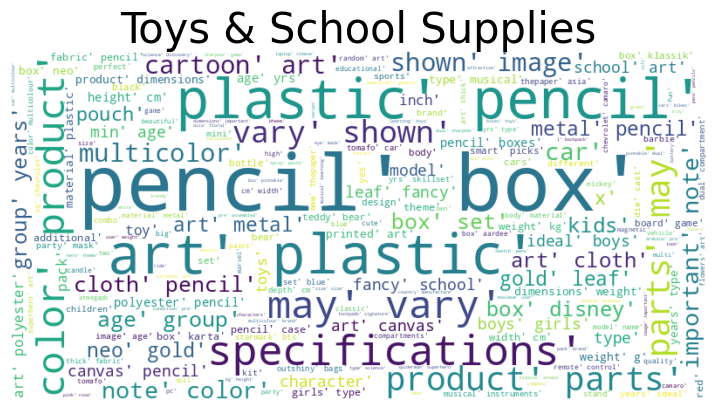

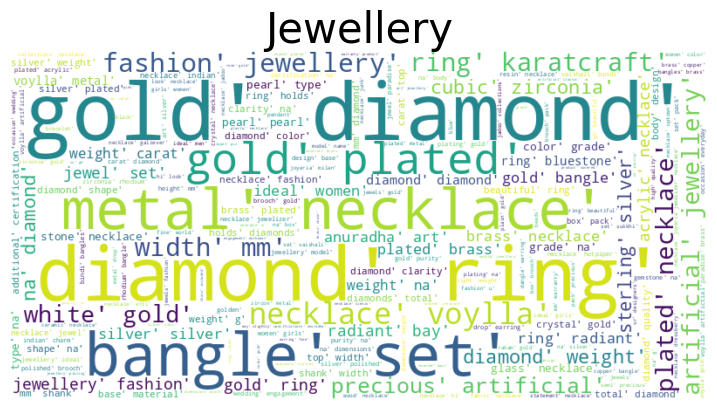

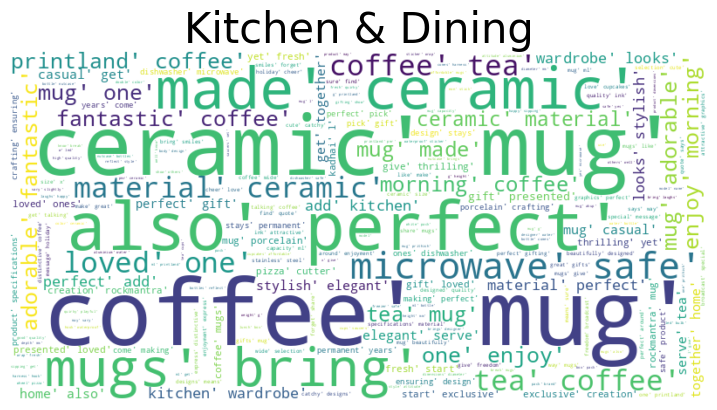

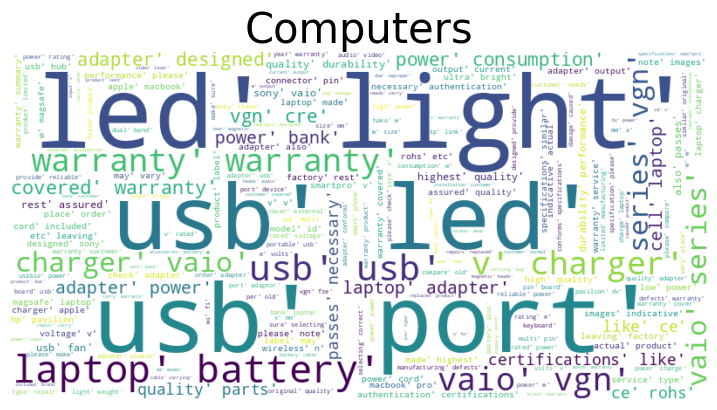

In [320]:
# This for loop goes through the labels and for each category will print the worldcloud.
for category in labels:
    show_wordcloud(df[df['product_category_tree']==category], category)

In [321]:
def convert_to_string(words):
    return ' '.join(words)

df['description'] = df.apply(lambda row: convert_to_string(row['description']), axis=1)


In [322]:
df['description']

0        alisha solid women cycling shorts cotton lycra...
1        aw bellies sandals wedges heel casuals aw bell...
2        alisha solid women cycling shorts cotton lycra...
3        alisha solid women cycling shorts cotton lycra...
4        dilli bazaaar bellies corporate casuals casual...
                               ...                        
14994    thelostpuppy back cover apple ipad air multico...
14995    kenway retail brass copper cuff sultry swagger...
14996    thelostpuppy back cover apple ipad air multico...
14997    kenway retail brass copper cuff hot swagger se...
14998    kenway retail brass copper cuff spunky swagger...
Name: description, Length: 14998, dtype: object

### Loading test data and doing the same preprocessing steps like the train data

In [323]:
test_data_df=pd.read_csv('test_data.csv')

In [324]:
test_data_df.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet...,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bra...,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/...,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Kalpaveda Copper Copper Cuff\n ...,No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchabl..."
2,ee6ce2c7045c54257e2a0b590e09c296,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air,ACCEA4DZH6M5SFVH,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air (Mu...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
3,e797ba3b5f2e2d1fdc520e48486ab60e,2015-12-20 08:26:17 +0000,http://www.flipkart.com/riana-copper-bangle/p/...,Riana Copper Copper Bangle,BBAEAXFQHHMF3EYZ,2499.0,649.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Riana Copper Copper Bangle - Buy Riana Copper ...,5,5,Riana,"{""product_specification""=>[{""key""=>""Collection..."
4,f4d8d43858c8858c68d75ce07ac641c0,2015-12-20 08:26:17 +0000,http://www.flipkart.com/inox-jewelry-stainless...,Inox Jewelry Stainless Steel Cuff,BBAECH63WYDG6TE2,1629.0,1222.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Inox Jewelry Stainless Steel Cuff\n ...,No rating available,No rating available,Inox Jewelry,"{""product_specification""=>[{""key""=>""Stretchabl..."


In [325]:
test_data_df['description'].isna().sum()

0

In [326]:
test_data_df['description'] = test_data_df['description'].apply(clean_text)

In [327]:
test_data_df['description'] = test_data_df.apply(lambda row: nltk.word_tokenize(row['description']), axis=1)

In [328]:
test_data_df['description'] = test_data_df.apply(lambda row: remove_stopwords(row['description']),axis=1)

In [329]:
test_data_df['description'] = test_data_df['description'].apply(remove_freq_irrelevant_words)

In [330]:
test_data_df['description'] = test_data_df.apply(lambda row: convert_to_string(row['description']), axis=1)

### Loading test results data and preprocessing

In [331]:
test_results_df=pd.read_csv('test_results.csv')

In [332]:
test_results_df.head()

,product_category_tree
0,Jewellery
1,Jewellery
2,Mobiles & Accessories
3,Jewellery
4,Jewellery


In [333]:
test_results_df.columns

Index(['product_category_tree'], dtype='object')

In [334]:
test_results_df['product_category_tree']=test_results_df['product_category_tree'].str.strip()

## Feature Engineering


### Encoding

In [335]:
# Stripping whitespaces at the end of the category labels
df['product_category_tree']=df['product_category_tree'].str.strip()

In [336]:
# Encoding product categories
label_encoder = LabelEncoder()
df['category'] = label_encoder.fit_transform(df['product_category_tree'])

In [337]:
df['category'].unique()
print(len(df['product_category_tree'].unique()))

14


In [338]:
wordcount=[]
for wordlist in df['description'].str.split():
    wordcount.append(len(wordlist))
print(max(wordcount))

510


In [339]:
# Forming the X-train and y-train
X_train = df['description']
y_train = df['category']

In [340]:
# Encoding product categories
test_results_df['category']=label_encoder.transform(test_results_df['product_category_tree'])

In [341]:
# Forming the X-test and y-test
X_test = test_data_df['description']
y_test = test_results_df['category']

In [342]:
print("Shape of X-train: ",X_train.shape)
print("Shape of y-train: ",y_train.shape)
print("Shape of X-test: ",X_test.shape)
print("Shape of y-test: ",y_test.shape)

Shape of X-train:  (14998,)
Shape of y-train:  (14998,)
Shape of X-test:  (2534,)
Shape of y-test:  (2534,)


### Vectorization

In [343]:
# TF-IDF vectorization
tfidf_vectorizer = TfidfVectorizer(max_features=10000)
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [344]:
# Count vectorization
count_vectorizer = CountVectorizer(max_features=10000)
X_train_cv = count_vectorizer.fit_transform(X_train)
X_test_cv = count_vectorizer.transform(X_test)

In [345]:
print("Shape of X-train vector: ",X_train_cv.shape)
print("Shape of X-test vector: ",X_test_cv.shape)


Shape of X-train vector:  (14998, 10000)
Shape of X-test vector:  (2534, 10000)


## Performing Undersampling

In [346]:
from imblearn.under_sampling import RandomUnderSampler

In [385]:
# Perform undersampling on the train data
rus = RandomUnderSampler(random_state=42)
X_train_res, y_train_res = rus.fit_resample(X_train_tfidf, y_train)


In [386]:
print("Shape of X-train vector: ",X_train_res.shape)
print("Shape of y-train: ",y_train_res.shape)
print("Shape of X-test vector: ",X_test_tfidf.shape)
print("Shape of y-test: ",y_test.shape)

Shape of X-train vector:  (2212, 10000)
Shape of y-train:  (2212,)
Shape of X-test vector:  (2534, 10000)
Shape of y-test:  (2534,)


###Train Test Split the training data

In [351]:
from sklearn.model_selection import train_test_split

In [387]:
X_train1,X_test1,y_train1,y_test1=train_test_split(X_train_res,y_train_res,test_size=0.2,random_state=42)

## Model Building and Evaluation: Multi-class Product Categorization

### Machine Learning Models

In [388]:
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f'Accuracy: {accuracy_score(y_test, y_pred):.2f}')
    print("==== *****   CLASSIFICATION REPORT **** ======")
    print(classification_report(y_test, y_pred,target_names=label_encoder.classes_))
    sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

### Logistic Regression

Accuracy: 0.94
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       1.00      0.93      0.97        30
                 Baby Care       1.00      0.86      0.92        42
     Bags, Wallets & Belts       0.92      1.00      0.96        34
                  Clothing       0.89      0.97      0.93        35
                 Computers       0.85      0.92      0.88        25
                  Footwear       0.97      1.00      0.98        28
Home Decor & Festive Needs       0.91      1.00      0.96        32
                 Jewellery       1.00      1.00      1.00        35
          Kitchen & Dining       1.00      0.91      0.95        33
     Mobiles & Accessories       0.91      0.91      0.91        34
         Pens & Stationery       0.77      0.87      0.82        23
          Tools & Hardware       1.00      0.93      0.97        30
    Toys & School Supplies       0.92      0.89      

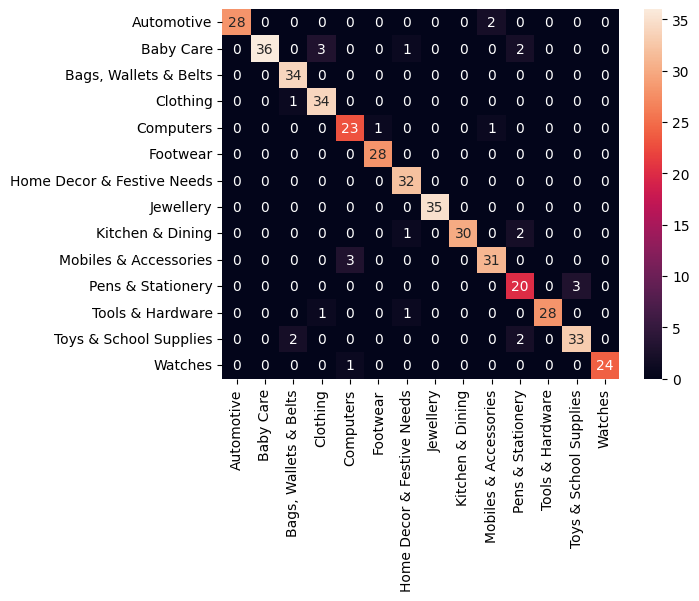

In [389]:
# Logistic Regression using TF-IDF
log_reg = LogisticRegression(max_iter=1000)
evaluate_model(log_reg, X_train1, X_test1, y_train1, y_test1)

### Random Forest Classifier

Accuracy: 0.93
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       1.00      0.93      0.97        30
                 Baby Care       0.97      0.90      0.94        42
     Bags, Wallets & Belts       0.94      1.00      0.97        34
                  Clothing       0.97      0.91      0.94        35
                 Computers       0.67      0.96      0.79        25
                  Footwear       0.97      1.00      0.98        28
Home Decor & Festive Needs       0.97      0.94      0.95        32
                 Jewellery       1.00      0.97      0.99        35
          Kitchen & Dining       0.97      0.91      0.94        33
     Mobiles & Accessories       0.91      0.94      0.93        34
         Pens & Stationery       0.67      0.78      0.72        23
          Tools & Hardware       1.00      0.93      0.97        30
    Toys & School Supplies       0.94      0.81      

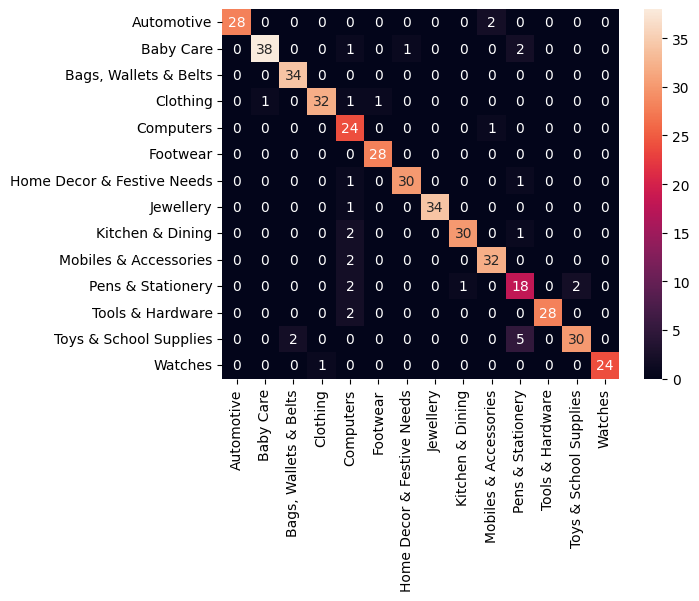

In [390]:
# Random Forest using TF-IDF
rf_clf = RandomForestClassifier(n_estimators=100)
evaluate_model(rf_clf, X_train1, X_test1, y_train1, y_test1)

### Support Vector Classifier

Accuracy: 0.94
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       1.00      0.93      0.97        30
                 Baby Care       1.00      0.83      0.91        42
     Bags, Wallets & Belts       0.94      1.00      0.97        34
                  Clothing       0.88      1.00      0.93        35
                 Computers       0.88      0.92      0.90        25
                  Footwear       0.93      1.00      0.97        28
Home Decor & Festive Needs       0.97      1.00      0.98        32
                 Jewellery       1.00      1.00      1.00        35
          Kitchen & Dining       0.97      1.00      0.99        33
     Mobiles & Accessories       0.94      0.88      0.91        34
         Pens & Stationery       0.74      0.87      0.80        23
          Tools & Hardware       1.00      0.93      0.97        30
    Toys & School Supplies       0.91      0.86      

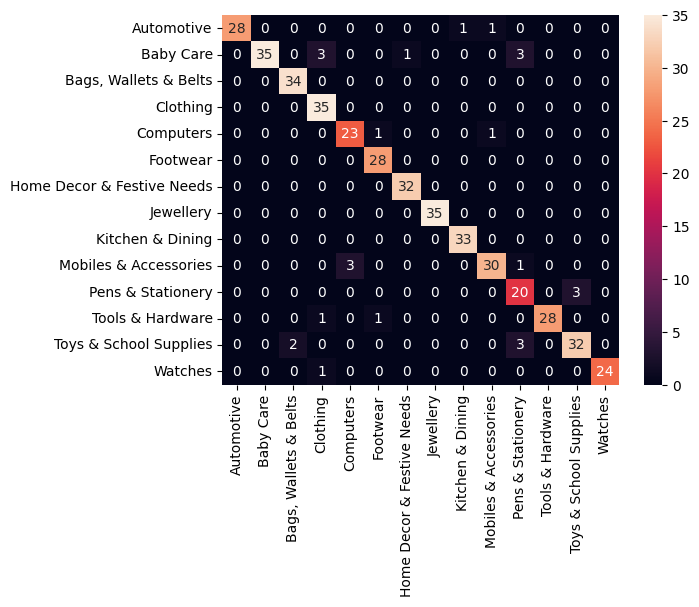

In [391]:
# Support Vector Classifier using TF-IDF
svc_clf = SVC()
evaluate_model(svc_clf, X_train1, X_test1, y_train1, y_test1)

### Naive Bayes Classifier

Accuracy: 0.94
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       0.97      0.97      0.97        30
                 Baby Care       0.92      0.86      0.89        42
     Bags, Wallets & Belts       0.85      1.00      0.92        34
                  Clothing       0.94      0.89      0.91        35
                 Computers       0.85      0.92      0.88        25
                  Footwear       1.00      1.00      1.00        28
Home Decor & Festive Needs       0.97      1.00      0.98        32
                 Jewellery       1.00      1.00      1.00        35
          Kitchen & Dining       1.00      0.94      0.97        33
     Mobiles & Accessories       0.91      0.88      0.90        34
         Pens & Stationery       0.80      0.87      0.83        23
          Tools & Hardware       1.00      0.97      0.98        30
    Toys & School Supplies       0.92      0.89      

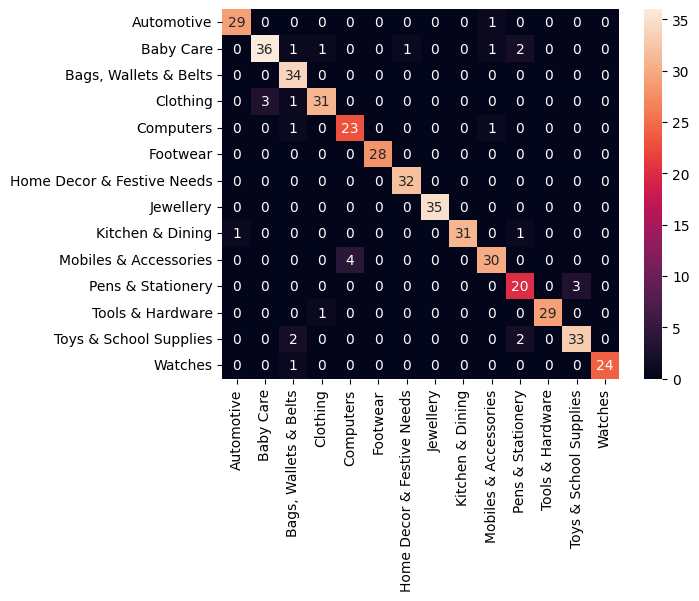

In [392]:
# Naive Bayes Classifier using TF-IDF
naivebayes_clf = MultinomialNB()
evaluate_model(naivebayes_clf, X_train1, X_test1, y_train1, y_test1)

### Decision Tree Classifier

Accuracy: 0.88
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       1.00      0.93      0.97        30
                 Baby Care       0.97      0.86      0.91        42
     Bags, Wallets & Belts       0.85      0.97      0.90        34
                  Clothing       0.94      0.83      0.88        35
                 Computers       0.69      0.88      0.77        25
                  Footwear       0.97      1.00      0.98        28
Home Decor & Festive Needs       0.90      0.88      0.89        32
                 Jewellery       0.97      0.89      0.93        35
          Kitchen & Dining       0.88      0.88      0.88        33
     Mobiles & Accessories       0.90      0.82      0.86        34
         Pens & Stationery       0.59      0.74      0.65        23
          Tools & Hardware       0.85      0.97      0.91        30
    Toys & School Supplies       0.91      0.81      

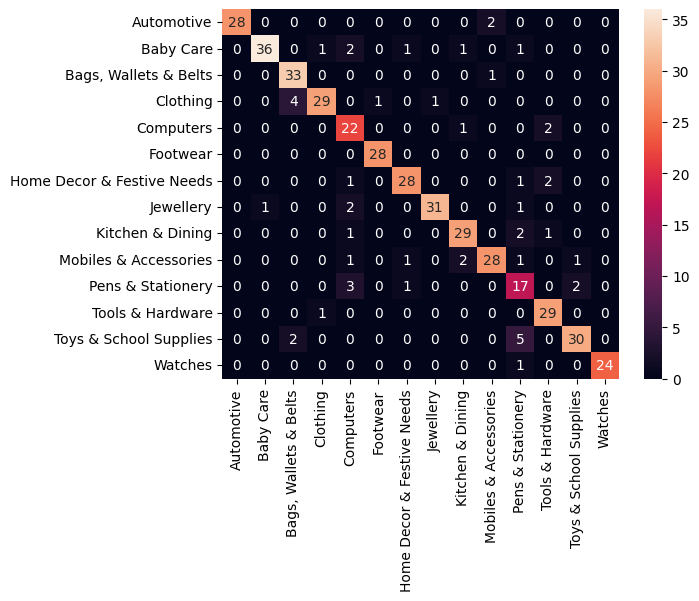

In [393]:
# Using TF-IDF
dt_clf=DecisionTreeClassifier(random_state=42)
evaluate_model(dt_clf, X_train1, X_test1, y_train1, y_test1)

### Gradient Boosting Classifier

Accuracy: 0.92
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       1.00      0.93      0.97        30
                 Baby Care       1.00      0.88      0.94        42
     Bags, Wallets & Belts       0.92      1.00      0.96        34
                  Clothing       0.97      0.89      0.93        35
                 Computers       0.95      0.80      0.87        25
                  Footwear       0.97      1.00      0.98        28
Home Decor & Festive Needs       1.00      0.97      0.98        32
                 Jewellery       1.00      0.91      0.96        35
          Kitchen & Dining       1.00      0.94      0.97        33
     Mobiles & Accessories       0.94      0.94      0.94        34
         Pens & Stationery       0.45      0.91      0.60        23
          Tools & Hardware       1.00      0.93      0.97        30
    Toys & School Supplies       0.94      0.81      

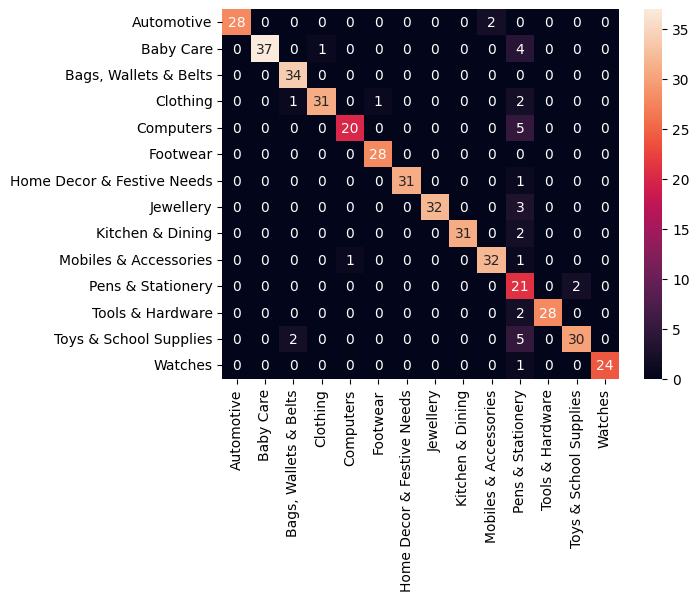

In [394]:
#Using TF-IDF
gb_clf=GradientBoostingClassifier(random_state=42)
evaluate_model(gb_clf, X_train1, X_test1, y_train1, y_test1)

### XGBoost Classifier

Accuracy: 0.91
==== *****   CLASSIFICATION REPORT **** ======
                            precision    recall  f1-score   support

                Automotive       0.96      0.90      0.93        30
                 Baby Care       1.00      0.90      0.95        42
     Bags, Wallets & Belts       0.87      1.00      0.93        34
                  Clothing       1.00      0.89      0.94        35
                 Computers       0.70      0.92      0.79        25
                  Footwear       0.97      1.00      0.98        28
Home Decor & Festive Needs       1.00      0.94      0.97        32
                 Jewellery       0.97      0.97      0.97        35
          Kitchen & Dining       0.97      0.94      0.95        33
     Mobiles & Accessories       0.89      0.91      0.90        34
         Pens & Stationery       0.58      0.83      0.68        23
          Tools & Hardware       1.00      0.93      0.97        30
    Toys & School Supplies       0.96      0.73      

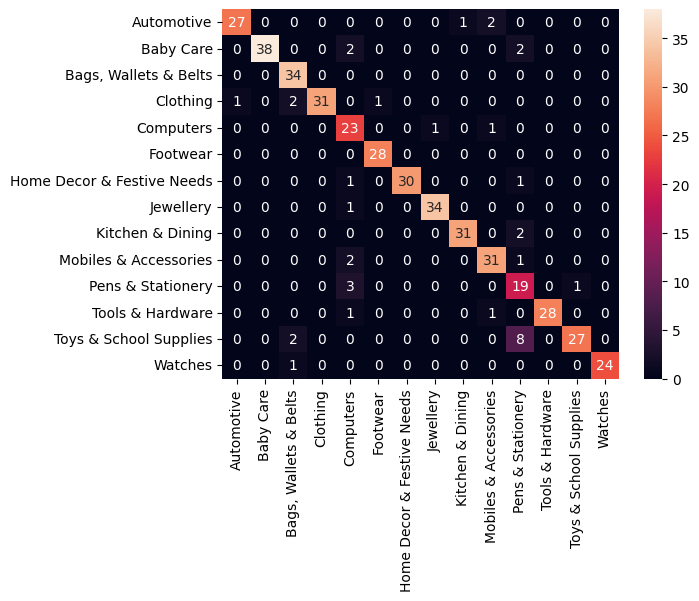

In [396]:
from xgboost import XGBClassifier
xgb_clf = XGBClassifier(random_state=42)
evaluate_model(xgb_clf, X_train1, X_test1, y_train1, y_test1)

### Observations:

1. The best performing models with undersampled training data with weighted average score of 94% are:**

    a. **Logistic Regression**

    b. **Support Vector Classifier**

    c. **Naive Bayes Classifer**
    

2. Due to target class imbalance and the mispredictions, we have applied **undersampling** to the data to address it.

3. Using TF-IDF is giving better model results than Count Vectorizer in general for the undersampled data.



### Naive Bayes model using TF-IDF Vectorizer with Hyperparameter tuning

In [397]:
# Define the parameter grid
param_grid = {
    'alpha': [0.1, 0.5, 1.0, 1.5, 2.0]
}

# Set up the GridSearchCV
gs = GridSearchCV(estimator=naivebayes_clf, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

# Fit the model
gs.fit(X_train1, y_train1)

# Best parameters and score
best_params = gs.best_params_
best_score = gs.best_score_

print("Best Parameters:", best_params)
print("Best Cross-Validation Score:", best_score)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best Parameters: {'alpha': 0.1}
Best Cross-Validation Score: 0.920847937773083


                            precision    recall  f1-score   support

                Automotive       1.00      0.97      0.98        30
                 Baby Care       0.97      0.83      0.90        42
     Bags, Wallets & Belts       0.85      1.00      0.92        34
                  Clothing       0.94      0.94      0.94        35
                 Computers       0.88      0.92      0.90        25
                  Footwear       1.00      1.00      1.00        28
Home Decor & Festive Needs       0.94      1.00      0.97        32
                 Jewellery       1.00      1.00      1.00        35
          Kitchen & Dining       1.00      0.97      0.98        33
     Mobiles & Accessories       0.91      0.91      0.91        34
         Pens & Stationery       0.80      0.87      0.83        23
          Tools & Hardware       1.00      0.97      0.98        30
    Toys & School Supplies       0.86      0.84      0.85        37
                   Watches       1.00      0.96

<Axes: >

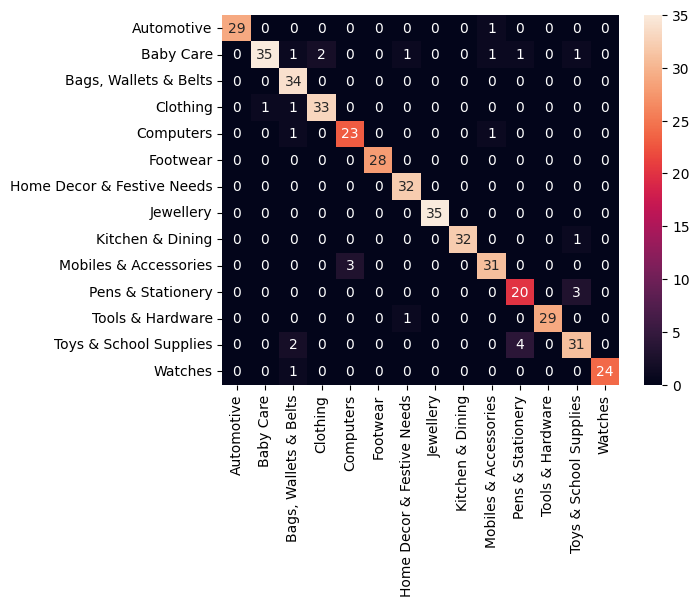

In [398]:
best_nb_clf=gs.best_estimator_

print(classification_report(y_test1,best_nb_clf.predict(X_test1),target_names=label_encoder.classes_))
sns.heatmap(confusion_matrix(y_test1, best_nb_clf.predict(X_test1)),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)






**There is no significant improvement in model performance with hyperparameter tuning. Accuracy and weighted average is at 94%**

In [128]:
from sklearn.decomposition import TruncatedSVD
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

### PCA using Truncated SVD


In [399]:
# Apply TruncatedSVD
n_components = 300  # Number of components to keep
svd = TruncatedSVD(n_components=n_components)
X_train_r = svd.fit_transform(X_train1)
X_test_r=svd.transform(X_test1)



##Deep Learning Model

In [400]:
# Define and train the model
model = Sequential()
model.add(Dense(128, input_dim=n_components, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(14, activation='softmax'))

# Compile the model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [401]:
X_train_r.shape,y_train1.shape,X_test_r.shape,y_test1.shape

((1769, 300), (1769,), (443, 300), (443,))

In [404]:
# Train the model
model.fit(X_train_r, y_train1, epochs=20, batch_size=64, validation_data=(X_test_r, y_test1))



Epoch 1/20
28/28 [==============================] - 0s 10ms/step - loss: 0.6253 - accuracy: 0.8609 - val_loss: 0.3994 - val_accuracy: 0.9391
Epoch 2/20
28/28 [==============================] - 0s 7ms/step - loss: 0.5681 - accuracy: 0.8649 - val_loss: 0.3527 - val_accuracy: 0.9391
Epoch 3/20
28/28 [==============================] - 0s 7ms/step - loss: 0.4841 - accuracy: 0.8915 - val_loss: 0.3223 - val_accuracy: 0.9413
Epoch 4/20
28/28 [==============================] - 0s 7ms/step - loss: 0.4375 - accuracy: 0.9011 - val_loss: 0.2988 - val_accuracy: 0.9368
Epoch 5/20
28/28 [==============================] - 0s 6ms/step - loss: 0.3963 - accuracy: 0.9045 - val_loss: 0.2832 - val_accuracy: 0.9458
Epoch 6/20
28/28 [==============================] - 0s 6ms/step - loss: 0.3764 - accuracy: 0.9011 - val_loss: 0.2647 - val_accuracy: 0.9458
Epoch 7/20
28/28 [==============================] - 0s 8ms/step - loss: 0.3383 - accuracy: 0.9175 - val_loss: 0.2594 - val_accuracy: 0.9481
Epoch 8/20
28/28 [=

In [405]:
# Evaluate the model
loss, accuracy = model.evaluate(X_test_r, y_test1)
print(f'Test Accuracy: {accuracy:.4f}')

14/14 [==============================] - 0s 5ms/step - loss: 0.2111 - accuracy: 0.9413
Test Accuracy: 0.9413


#Predicting the best models on the Test Data

In [413]:
y_pred_naivebayes=best_nb_clf.predict(X_test_tfidf)


==== ***** CLASSIFICATION REPORT NAIVE BAYES **** ======
                            precision    recall  f1-score   support

                Automotive       0.72      0.83      0.77        75
                 Baby Care       0.17      0.22      0.19       259
     Bags, Wallets & Belts       0.84      0.91      0.87       107
                  Clothing       0.98      0.67      0.80       882
                 Computers       0.58      0.30      0.39        47
                  Footwear       0.93      0.99      0.96       144
Home Decor & Festive Needs       0.46      0.82      0.59       215
                 Jewellery       0.99      0.90      0.94       313
          Kitchen & Dining       0.70      0.84      0.77        37
     Mobiles & Accessories       0.97      0.94      0.96       331
         Pens & Stationery       0.43      0.82      0.56        49
          Tools & Hardware       0.00      0.00      0.00        12
    Toys & School Supplies       0.82      0.83      0.82 

<Axes: >

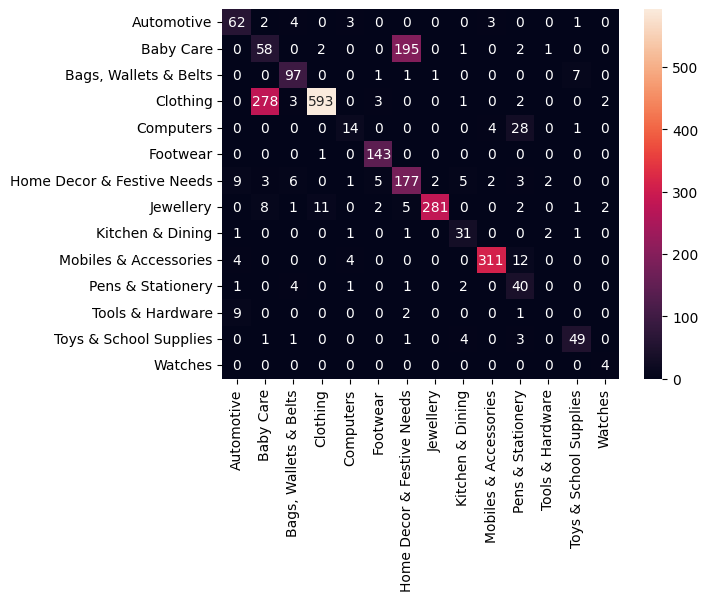

In [414]:
print("==== ***** CLASSIFICATION REPORT NAIVE BAYES **** ======")
print(classification_report(y_test, y_pred_naivebayes,target_names=label_encoder.classes_))
sns.heatmap(confusion_matrix(y_test, y_pred_naivebayes),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

==== ***** CLASSIFICATION REPORT LOGISTIC REGRESSION **** ======
                            precision    recall  f1-score   support

                Automotive       0.92      0.88      0.90        75
                 Baby Care       0.46      0.20      0.28       259
     Bags, Wallets & Belts       0.96      0.90      0.93       107
                  Clothing       0.98      0.93      0.96       882
                 Computers       0.74      0.98      0.84        47
                  Footwear       0.89      0.99      0.94       144
Home Decor & Festive Needs       0.45      0.81      0.58       215
                 Jewellery       0.95      0.93      0.94       313
          Kitchen & Dining       0.59      0.81      0.68        37
     Mobiles & Accessories       0.97      0.96      0.96       331
         Pens & Stationery       0.54      0.73      0.62        49
          Tools & Hardware       0.00      0.00      0.00        12
    Toys & School Supplies       0.96      0.81   

<Axes: >

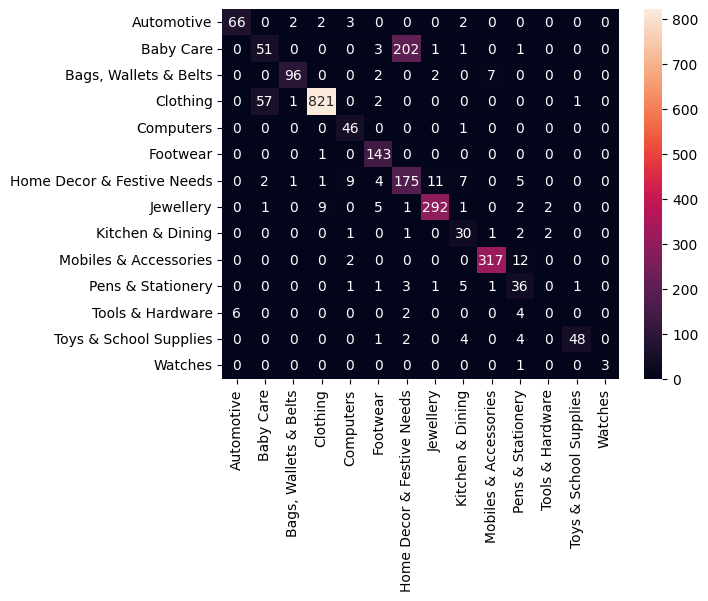

In [412]:
print("==== ***** CLASSIFICATION REPORT LOGISTIC REGRESSION **** ======")
print(classification_report(y_test, log_reg.predict(X_test_tfidf),target_names=label_encoder.classes_))
sns.heatmap(confusion_matrix(y_test, log_reg.predict(X_test_tfidf)),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

==== *****   CLASSIFICATION REPORT (SVC) **** ======


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                            precision    recall  f1-score   support

                Automotive       0.91      0.85      0.88        75
                 Baby Care       0.49      0.18      0.26       259
     Bags, Wallets & Belts       0.97      0.81      0.88       107
                  Clothing       0.98      0.95      0.96       882
                 Computers       0.73      0.98      0.84        47
                  Footwear       0.82      0.99      0.90       144
Home Decor & Festive Needs       0.45      0.79      0.57       215
                 Jewellery       0.95      0.95      0.95       313
          Kitchen & Dining       0.62      0.86      0.72        37
     Mobiles & Accessories       1.00      0.95      0.97       331
         Pens & Stationery       0.51      0.78      0.61        49
          Tools & Hardware       0.00      0.00      0.00        12
    Toys & School Supplies       0.92      0.81      0.86        59
                   Watches       1.00      0.75

<Axes: >

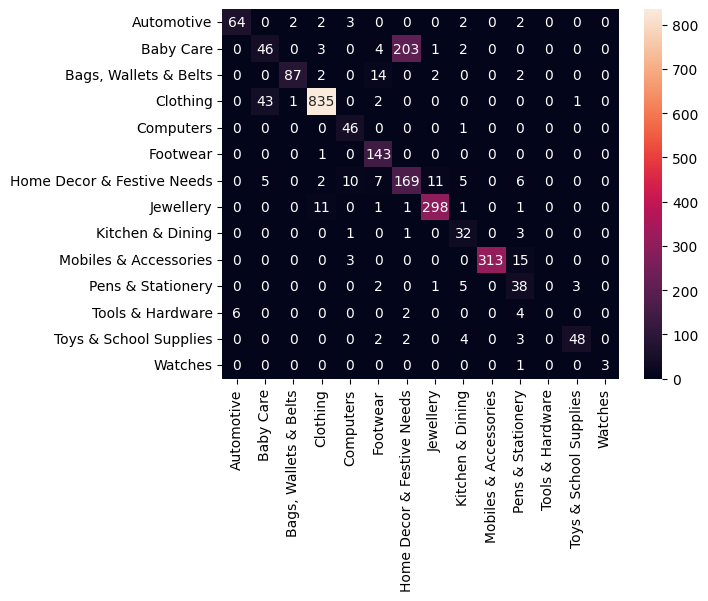

In [411]:
print("==== *****   CLASSIFICATION REPORT (SVC) **** ======")
print(classification_report(y_test, svc_clf.predict(X_test_tfidf),target_names=label_encoder.classes_))
sns.heatmap(confusion_matrix(y_test, svc_clf.predict(X_test_tfidf)),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

### Observations

1. Predicting on the entire test data set, **Logistic Regression and SVC perform better than Naive Bayes with a weighted average of 83%.**

2. **There is quite a lot of misclassification in 'Baby Care' category that is mispredicted as 'Home Decor & Festive Needs' without undersampling**

3. There might be noisy or ambiguous descriptions in the data that makes it hard for the model to classify correctly even after addressing class imbalance through undersampling.



In [423]:
y_pred_dl=np.argmax(model.predict(svd.transform(X_test_tfidf)),axis=1)

80/80 [==============================] - 0s 2ms/step


==== *****   CLASSIFICATION REPORT (DEEP LEARNING) **** ======
                            precision    recall  f1-score   support

                Automotive       0.81      0.87      0.84        75
                 Baby Care       0.47      0.21      0.29       259
     Bags, Wallets & Belts       0.97      0.85      0.91       107
                  Clothing       0.99      0.94      0.96       882
                 Computers       0.61      0.94      0.74        47
                  Footwear       0.97      0.99      0.98       144
Home Decor & Festive Needs       0.46      0.80      0.58       215
                 Jewellery       0.97      0.90      0.93       313
          Kitchen & Dining       0.61      0.84      0.70        37
     Mobiles & Accessories       0.98      0.99      0.99       331
         Pens & Stationery       0.56      0.78      0.65        49
          Tools & Hardware       0.00      0.00      0.00        12
    Toys & School Supplies       0.93      0.86     

<Axes: >

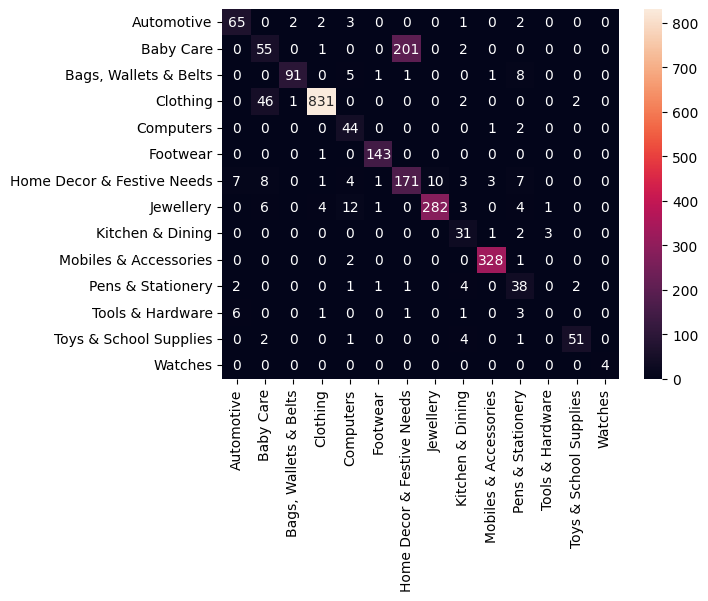

In [428]:
print("==== *****   CLASSIFICATION REPORT (DEEP LEARNING) **** ======")
print(classification_report(y_test, y_pred_dl,target_names=label_encoder.classes_))
sns.heatmap(confusion_matrix(y_test, y_pred_dl),annot=True,fmt='g',xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

**Deep Learning Model gives slightly better results than the machine learning models.**